# Exploring Glacial and iceshelf conditions in Antarctic using Sentinel-1

This notebook explores the behaviour of Sentinel-1 data below the Ross Shelf region, looking at characteristics of backscatter intensity of the snow/ice dynamics in that region, especially as it concerns with glacial motion, as well as seasonality of Antarctic winter and summer.

The main observations are:

* winter shows less deviation in intensity over time, and more deviation during summer time series
* transient wet snow characteristics seem to be represented in expected range of -15 to -25 decibels
* while transient wet snow have lower backscatter returns, their standard deviation over time is still greater
* animation of timeseries 2018-2023 shows agreement with NASA ITS_LIVE velocity map, with fairly minimal movement (thanks Robbi!)
* glacial flow can be tracked over time, where there is visual texture for optical flow algorithm to track (thanks Robbi!)

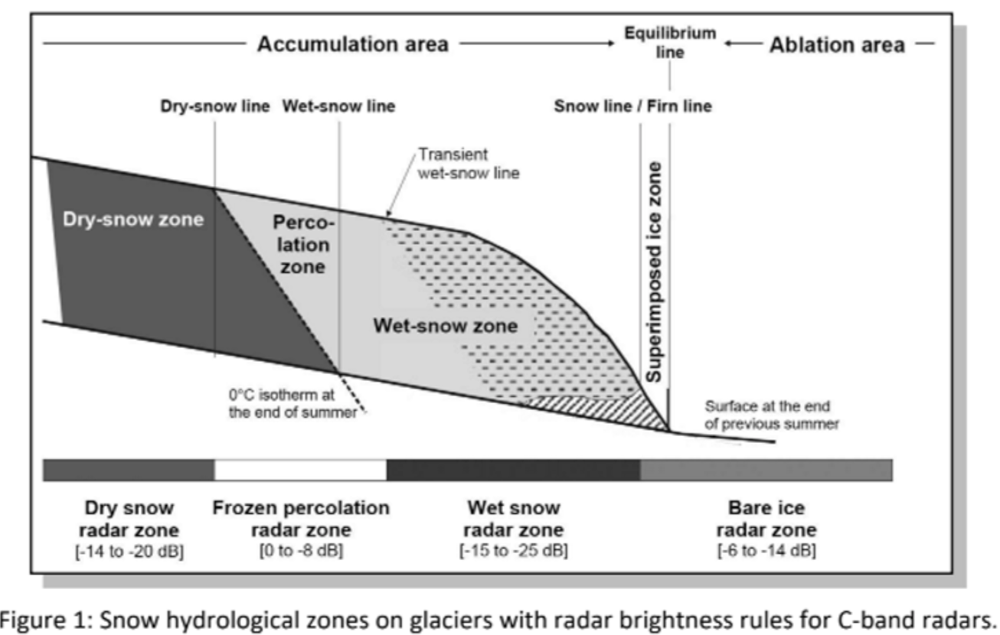

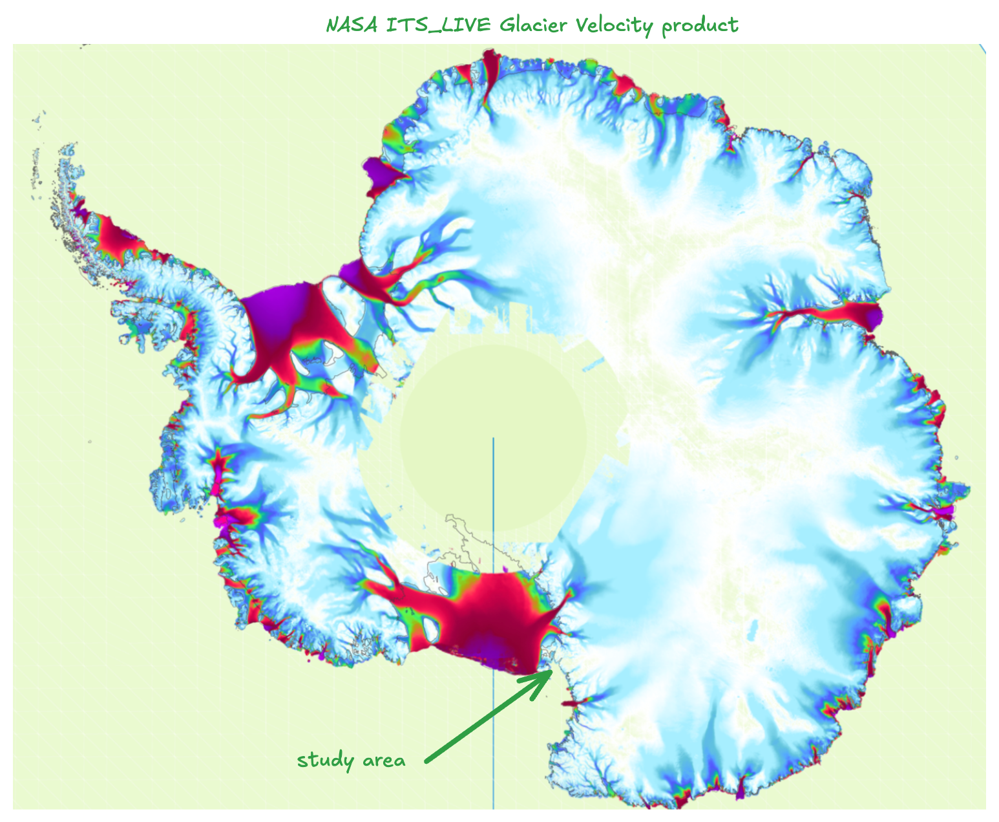

In [2]:
import datacube
import numpy as np
import matplotlib.pyplot as plt

In [3]:
dc = datacube.Datacube(env="dev")

In [4]:
def to_db(ds):
    return 10 * np.log10(ds)

In [5]:
coast_xx = (163.344727, 163.850098)
coast_yy = (-77.678501, -77.555994)

In [6]:
ant_ds = dc.load(
    product="ga_s1_iw_hh_c0",
    x=coast_xx,
    y=coast_yy,
    time=("2018-01-10", "2018-01-11"),
    measurements=["HH"],
    output_crs="EPSG:3031",
    resolution=(20, -20),
    dask_chunks={},
)

ant_ds

<xarray.Dataset> Size: 2MB
Dimensions:      (time: 1, y: 814, x: 762)
Coordinates:
  * time         (time) datetime64[ns] 8B 2018-01-10T12:47:49.859790
  * y            (y) float64 7kB -1.304e+06 -1.304e+06 ... -1.287e+06 -1.287e+06
  * x            (x) float64 6kB 3.89e+05 3.89e+05 ... 3.738e+05 3.738e+05
    spatial_ref  int32 4B 3031
Data variables:
    HH           (time, y, x) float32 2MB dask.array<chunksize=(1, 814, 762), meta=np.ndarray>
Attributes:
    crs:           EPSG:3031
    grid_mapping:  spatial_ref

In [7]:
m = to_db(ant_ds.HH).odc.explore(robust=True,
                                 tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                                 attr = 'Esri',
                                 name = 'HH',
                                 cmap='viridis',)
m

/env/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


# Winter 2018 May - September

In [8]:
winter = ("2018-05-01", "2018-09-30")

In [9]:
ant_ds = dc.load(
    product="ga_s1_iw_hh_c0",
    x=coast_xx,
    y=coast_yy,
    time=winter,
    measurements=["HH"],
    output_crs="EPSG:3031",
    resolution=(20, -20),
    dask_chunks={},
)

ant_ds

<xarray.Dataset> Size: 30MB
Dimensions:      (time: 12, y: 814, x: 762)
Coordinates:
  * time         (time) datetime64[ns] 96B 2018-05-10T12:47:51.019892 ... 201...
  * y            (y) float64 7kB -1.304e+06 -1.304e+06 ... -1.287e+06 -1.287e+06
  * x            (x) float64 6kB 3.89e+05 3.89e+05 ... 3.738e+05 3.738e+05
    spatial_ref  int32 4B 3031
Data variables:
    HH           (time, y, x) float32 30MB dask.array<chunksize=(1, 814, 762), meta=np.ndarray>
Attributes:
    crs:           EPSG:3031
    grid_mapping:  spatial_ref

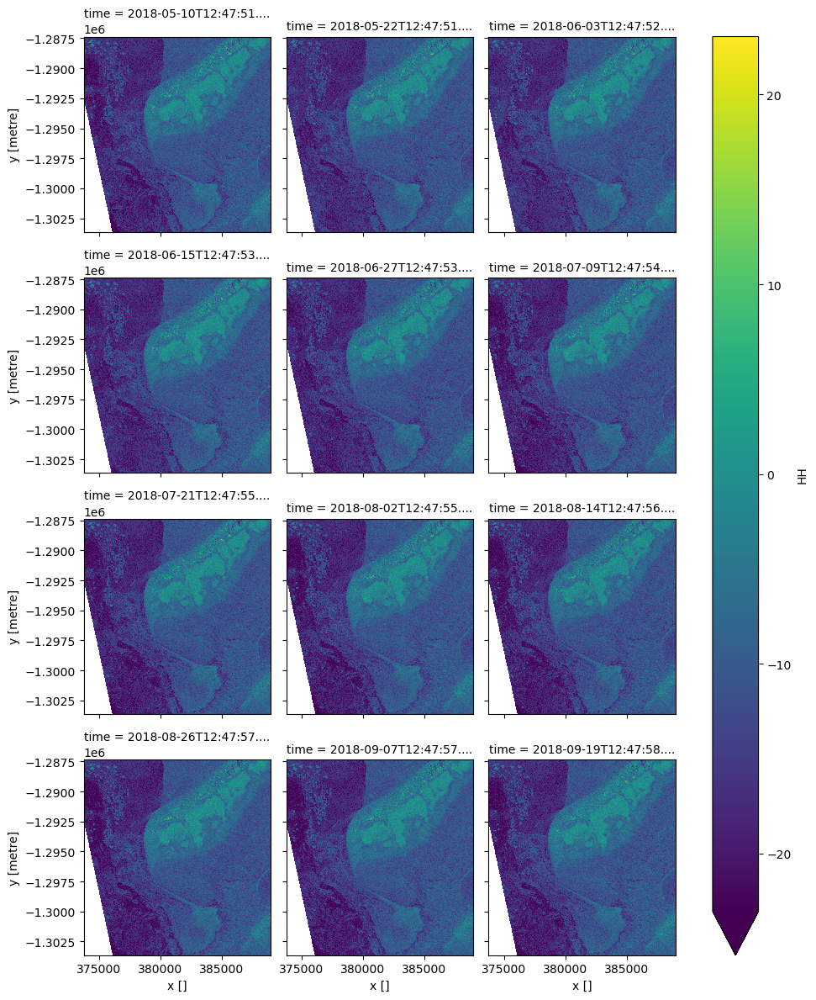

In [10]:
to_db(ant_ds.HH).plot.imshow(col="time", col_wrap=3, robust=True, cmap="viridis")

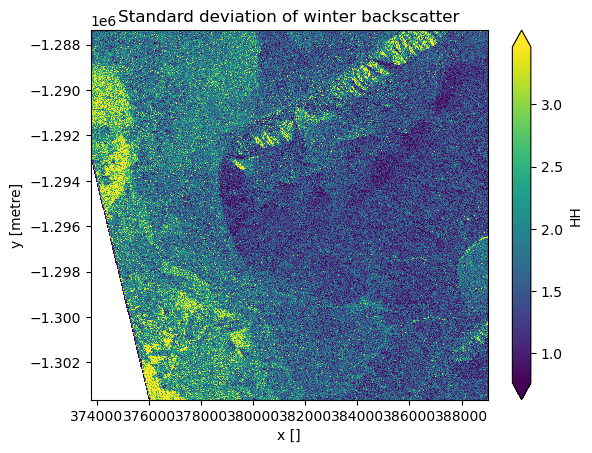

In [11]:
to_db(ant_ds.HH).std(dim="time").plot.imshow(robust=True)
plt.title("Standard deviation of winter backscatter");

# Summer November 2018 - Feb 2019

In [12]:
summer = ("2018-11-01", "2019-02-28")

In [13]:
ant_ds = dc.load(
    product="ga_s1_iw_hh_c0",
    x=coast_xx,
    y=coast_yy,
    time=summer,
    measurements=["HH"],
    output_crs="EPSG:3031",
    resolution=(20, -20),
    dask_chunks={},
)

ant_ds

<xarray.Dataset> Size: 25MB
Dimensions:      (time: 10, y: 814, x: 762)
Coordinates:
  * time         (time) datetime64[ns] 80B 2018-11-06T12:47:58.638431 ... 201...
  * y            (y) float64 7kB -1.304e+06 -1.304e+06 ... -1.287e+06 -1.287e+06
  * x            (x) float64 6kB 3.89e+05 3.89e+05 ... 3.738e+05 3.738e+05
    spatial_ref  int32 4B 3031
Data variables:
    HH           (time, y, x) float32 25MB dask.array<chunksize=(1, 814, 762), meta=np.ndarray>
Attributes:
    crs:           EPSG:3031
    grid_mapping:  spatial_ref

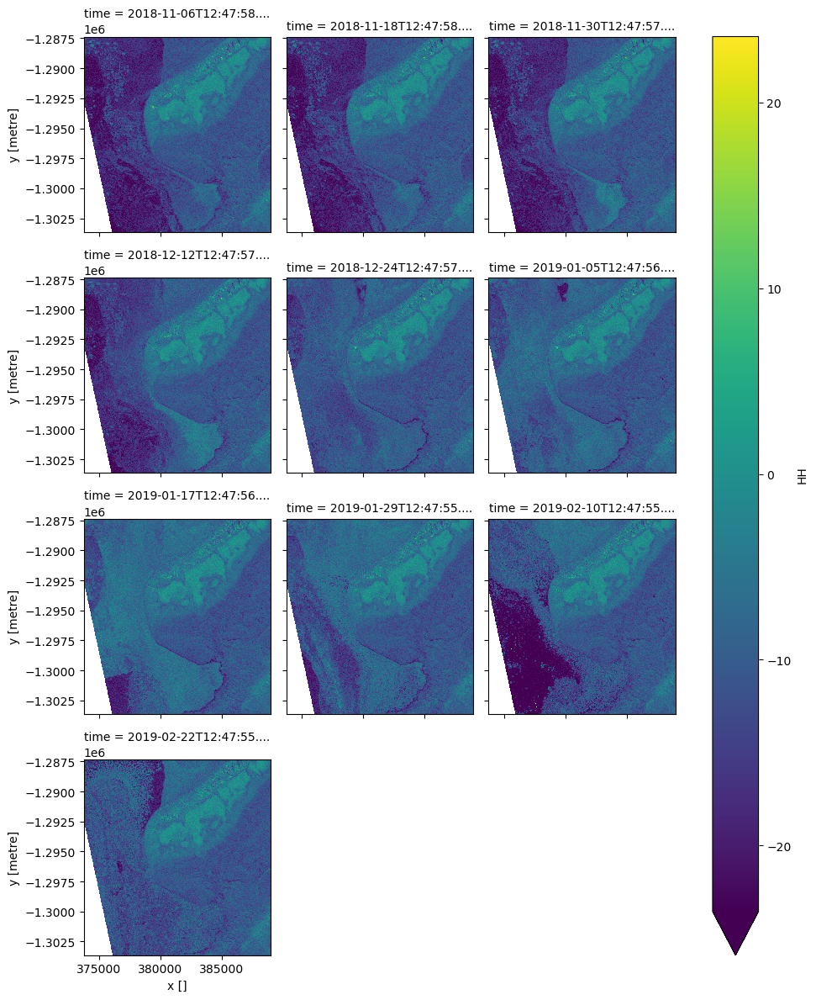

In [14]:
to_db(ant_ds.HH).plot.imshow(col="time", col_wrap=3, robust=True, cmap="viridis")

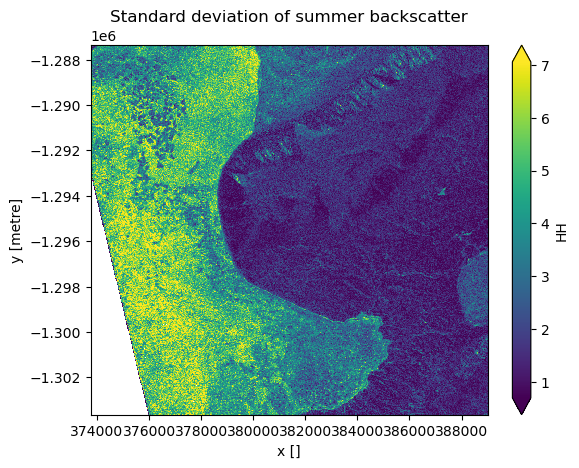

In [15]:
to_db(ant_ds.HH).std(dim="time").plot.imshow(robust=True)
plt.title("Standard deviation of summer backscatter");